# Battle of the Neighborhoods: Finding the best Neighborhood for purchasing a home in Barcelona

## Introduction

We want to determine the best district for purchasing a house in Barcelona, considering certain, but not all, relevant factors that can determine its success such as:
- Venue density in each district, providing convenient services such as supermarkets, Pharmacies, bars, restaurants etc…
- Housing price index per district. 
- Compound Average Growth Rate of the Housing Price Index per district.
- Coordinates of each district.

For the first point, we'll be using the Foursquare API to explore the neighborhoods in Barcelona, in order to get the most common venue categories in each neighborhood, then use this feature to group neighborhoods into clusters.We'll use the _k_-means clustering algorithm to cluster the neighborhoods based on the most common venues. For the second and third points, we'll be using a database I've previously wrangled in the data regarding each district with the Housing Price Index, Compound Average Growth Rate, and coordinates.

## Table of Contents

<div class="alert alert-block alert-info" style="margin-top: 20px">

<font size = 3>

1.  <a href="#item1">Download and Explore Dataset</a>

2.  <a href="#item2">Data Wrangling</a>

3.  <a href="#item3">Exploratory Data Analysis</a>

4.  <a href="#item4">Cluster Neighborhoods</a>

5.  <a href="#item5">Examine Clusters</a>  
    </font>
    </div>

### _Lets start by downloading the libraries we'll need._

In [1]:
import numpy as np # library to handle data in a vectorized manner

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library


import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

import geopandas as gpd

import seaborn as sns

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt 

# import k-means from clustering stage
from sklearn.cluster import KMeans

print('Libraries imported.')

Libraries imported.


## 1. Download and Explore Dataset

In [2]:
df = pd.read_excel (r'/Users/kristopherzapata/Documents/Data Science Course IBM copy/Applied Data Science Capstone/Detailled Barris Housing Prices.xlsx')
print (df)

                                    Neighborhood  Avg Price per m2      CAGR
0                                  Baró de Viver               NaN       NaN
1                                       Can Baró            3339.0  5.894268
2                                    Can Peguera               NaN       NaN
3               Canyelles, Nou Barris, Barcelona               NaN       NaN
4                               Ciutat Meridiana            1690.0  2.456182
5   Diagonal Mar i el Front Marítim del Poblenou            6237.0  4.055311
6                               el Baix Guinardó            3611.0  4.758328
7                                 el Barri Gòtic            4717.0  3.093769
8                          el Besòs i el Maresme            2547.0  4.094427
9                                  el Bon Pastor            2380.0  4.017967
10            el Camp d'en Grassot i Gràcia Nova            4399.0  4.910521
11                    el Camp de l'Arpa del Clot            3555.0  5.266727

### Let's convert it into a Dataframe

In [3]:
df = pd.DataFrame(df)
df

,Neighborhood,Avg Price per m2,CAGR
0,Baró de Viver,NaN,NaN
1,Can Baró,3339.0,5.894268
2,Can Peguera,NaN,NaN
3,"Canyelles, Nou Barris, Barcelona",NaN,NaN
4,Ciutat Meridiana,1690.0,2.456182
5,Diagonal Mar i el Front Marítim del Poblenou,6237.0,4.055311
6,el Baix Guinardó,3611.0,4.758328
7,el Barri Gòtic,4717.0,3.093769
8,el Besòs i el Maresme,2547.0,4.094427
9,el Bon Pastor,2380.0,4.017967


## 2. Data Wrangling
Now we'll proceed with cleaning up and preparing the dataset for executing exploratory data analysis and running the kmeans algorithm in order to define the clusters.

### Missing values
There are some rows with missing values, for which we can either drop the rows or add the mean value of the whole column in each row with missing values. In this case, it's better to add the mean value, since each row represents a neighborhood in the city, therefore, if we were to eliminate these rows, the maps would not contain all the relevant information.

In [4]:
print(df.shape)

(73, 3)


In [5]:
avg_price=df['Avg Price per m2'].astype('float').mean(axis=0)
avg_cagr=df['CAGR'].astype('float').mean(axis=0)

print("Average of AVG PRICE PER M2:", avg_price)
print("Average CAGR:", avg_cagr)

Average of AVG PRICE PER M2: 3695.1060606060605
Average CAGR: 4.1854772926706465


In [6]:
df["Avg Price per m2"].replace(np.nan, avg_price, inplace=True)
df["CAGR"].replace(np.nan, avg_cagr, inplace=True)
print(df['Avg Price per m2'].value_counts())
print(df['CAGR'].value_counts())

3695.106061    7
2953.000000    2
3705.000000    2
2380.000000    1
4763.000000    1
4091.000000    1
6237.000000    1
2867.000000    1
4654.000000    1
5558.000000    1
1809.000000    1
2547.000000    1
2889.000000    1
2861.000000    1
3587.000000    1
2097.000000    1
3611.000000    1
3250.000000    1
4219.000000    1
3918.000000    1
3271.000000    1
2503.000000    1
2200.000000    1
2498.000000    1
1690.000000    1
5190.000000    1
2994.000000    1
3856.000000    1
3767.000000    1
3161.000000    1
4557.000000    1
2532.000000    1
3128.000000    1
5326.000000    1
6460.000000    1
4399.000000    1
3579.000000    1
3420.000000    1
3555.000000    1
4567.000000    1
3547.000000    1
4717.000000    1
3716.000000    1
2534.000000    1
4532.000000    1
3467.000000    1
3845.000000    1
3339.000000    1
4837.000000    1
5115.000000    1
2754.000000    1
3701.000000    1
4343.000000    1
4088.000000    1
5267.000000    1
5395.000000    1
5749.000000    1
3293.000000    1
3239.000000   

#### Now, we'll want to extract the coordinates for each neighborhood using the geocoder function

In [7]:
locator = Nominatim(user_agent="myGeocoder")

from geopy.extra.rate_limiter import RateLimiter

# 1 - conveneint function to delay between geocoding calls
geocode = RateLimiter(locator.geocode, min_delay_seconds=1)
# 2- - create location column
df['Location'] = df['Neighborhood'].apply(geocode)
# 3 - create longitude, laatitude and altitude from location column (returns tuple)
df['Point'] = df['Location'].apply(lambda loc: tuple(loc.point) if loc else None)
# 4 - split point column into latitude, longitude and altitude columns
df[['Latitude', 'Longitude', 'Altitude']] = pd.DataFrame(df['Point'].tolist(), index=df.index)

In [8]:
df.head()

,Neighborhood,Avg Price per m2,CAGR,Location,Point,Latitude,Longitude,Altitude
0,Baró de Viver,3695.106061,4.185477,"(Baró de Viver, Besòs, la Trinitat Vella, Sant...","(41.4499467, 2.1995389, 0.0)",41.449947,2.199539,0.0
1,Can Baró,3339.000000,5.894268,"(Can Baró, Horta-Guinardó, Barcelona, Barcelon...","(41.4160925, 2.1624018, 0.0)",41.416092,2.162402,0.0
2,Can Peguera,3695.106061,4.185477,"(Can Peguera, Nou Barris, Barcelona, Barcelonè...","(41.4348568, 2.1657848, 0.0)",41.434857,2.165785,0.0
3,"Canyelles, Nou Barris, Barcelona",3695.106061,4.185477,"(Canyelles, Nou Barris, Barcelona, Barcelonès,...","(41.4428353, 2.1652279, 0.0)",41.442835,2.165228,0.0
4,Ciutat Meridiana,1690.000000,2.456182,"(Ciutat Meridiana, Nou Barris, Barcelona, Barc...","(41.4609185, 2.1745668, 0.0)",41.460918,2.174567,0.0


### Drop Columns
We won't be needing the columns named "POINT" and "ALTITUDE", therefore we'll be dropping them.

In [9]:
df = df.drop(['Point','Altitude'], axis=1)
df.head()

,Neighborhood,Avg Price per m2,CAGR,Location,Latitude,Longitude
0,Baró de Viver,3695.106061,4.185477,"(Baró de Viver, Besòs, la Trinitat Vella, Sant...",41.449947,2.199539
1,Can Baró,3339.000000,5.894268,"(Can Baró, Horta-Guinardó, Barcelona, Barcelon...",41.416092,2.162402
2,Can Peguera,3695.106061,4.185477,"(Can Peguera, Nou Barris, Barcelona, Barcelonè...",41.434857,2.165785
3,"Canyelles, Nou Barris, Barcelona",3695.106061,4.185477,"(Canyelles, Nou Barris, Barcelona, Barcelonès,...",41.442835,2.165228
4,Ciutat Meridiana,1690.000000,2.456182,"(Ciutat Meridiana, Nou Barris, Barcelona, Barc...",41.460918,2.174567


In [10]:
df

,Neighborhood,Avg Price per m2,CAGR,Location,Latitude,Longitude
0,Baró de Viver,3695.106061,4.185477,"(Baró de Viver, Besòs, la Trinitat Vella, Sant...",41.449947,2.199539
1,Can Baró,3339.000000,5.894268,"(Can Baró, Horta-Guinardó, Barcelona, Barcelon...",41.416092,2.162402
2,Can Peguera,3695.106061,4.185477,"(Can Peguera, Nou Barris, Barcelona, Barcelonè...",41.434857,2.165785
3,"Canyelles, Nou Barris, Barcelona",3695.106061,4.185477,"(Canyelles, Nou Barris, Barcelona, Barcelonès,...",41.442835,2.165228
4,Ciutat Meridiana,1690.000000,2.456182,"(Ciutat Meridiana, Nou Barris, Barcelona, Barc...",41.460918,2.174567
5,Diagonal Mar i el Front Marítim del Poblenou,6237.000000,4.055311,"(Diagonal Mar i el Front Marítim del Poblenou,...",41.405228,2.213352
6,el Baix Guinardó,3611.000000,4.758328,"(el Baix Guinardó, Horta-Guinardó, Barcelona, ...",41.411437,2.168651
7,el Barri Gòtic,4717.000000,3.093769,"(el Gòtic, Ciutat Vella, Barcelona, Barcelonès...",41.383395,2.176912
8,el Besòs i el Maresme,2547.000000,4.094427,"(el Besòs i el Maresme, Sant Martí, Barcelona,...",41.414979,2.213877
9,el Bon Pastor,2380.000000,4.017967,"(Bon Pastor, Carrer de Sant Adrià, el Bon Past...",41.436110,2.204807


In [11]:
df['Neighborhood'] = df['Neighborhood'].replace(['el Coll, Gràcia, Barcelona'],'el Coll')
df['Neighborhood'] = df['Neighborhood'].replace(['la Clota, Barcelona'],'la Clota')
df['Neighborhood'] = df['Neighborhood'].replace(['Navas, Sant Andreu, Barcelona'],'Navas')
df['Neighborhood'] = df['Neighborhood'].replace(['Vallbona, Nou Barris, Barcelona'],'Vallbona')
df['Neighborhood'] = df['Neighborhood'].replace(['Canyelles, Nou Barris, Barcelona'],'Canyelles')
df['Neighborhood'] = df['Neighborhood'].replace(['el Carmel, Horta-Guinardó, Barcelona'],'el Carmel')
df['Neighborhood'] = df['Neighborhood'].replace(['Horta, Horta-Guinardó, Barcelona'],'Horta')
df['Neighborhood'] = df['Neighborhood'].replace(['Porta, Nou Barris, Barcelona'],'Porta')
df['Neighborhood'] = df['Neighborhood'].replace(['Verdun, Nou Barris, Barcelona'],'Verdun')
df

,Neighborhood,Avg Price per m2,CAGR,Location,Latitude,Longitude
0,Baró de Viver,3695.106061,4.185477,"(Baró de Viver, Besòs, la Trinitat Vella, Sant...",41.449947,2.199539
1,Can Baró,3339.000000,5.894268,"(Can Baró, Horta-Guinardó, Barcelona, Barcelon...",41.416092,2.162402
2,Can Peguera,3695.106061,4.185477,"(Can Peguera, Nou Barris, Barcelona, Barcelonè...",41.434857,2.165785
3,Canyelles,3695.106061,4.185477,"(Canyelles, Nou Barris, Barcelona, Barcelonès,...",41.442835,2.165228
4,Ciutat Meridiana,1690.000000,2.456182,"(Ciutat Meridiana, Nou Barris, Barcelona, Barc...",41.460918,2.174567
5,Diagonal Mar i el Front Marítim del Poblenou,6237.000000,4.055311,"(Diagonal Mar i el Front Marítim del Poblenou,...",41.405228,2.213352
6,el Baix Guinardó,3611.000000,4.758328,"(el Baix Guinardó, Horta-Guinardó, Barcelona, ...",41.411437,2.168651
7,el Barri Gòtic,4717.000000,3.093769,"(el Gòtic, Ciutat Vella, Barcelona, Barcelonès...",41.383395,2.176912
8,el Besòs i el Maresme,2547.000000,4.094427,"(el Besòs i el Maresme, Sant Martí, Barcelona,...",41.414979,2.213877
9,el Bon Pastor,2380.000000,4.017967,"(Bon Pastor, Carrer de Sant Adrià, el Bon Past...",41.436110,2.204807


#### Use geopy library to get the latitude and longitude values of Barcelona.
In order to define an instance of the geocoder, we need to define a user_agent. We will name our agent bcn_explorer, as shown below.

In [12]:
address = 'Barcelona, Spain'

geolocator = Nominatim(user_agent="bcn_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Barcelona, Spain are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Barcelona, Spain are 41.3828939, 2.1774322.


#### Let's create a map of Barcelona with neighborhoods superimposed on top.

In [13]:
# create map of New York using latitude and longitude values
map_bcn = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, neighborhood in zip(df['Latitude'], df['Longitude'], df['Neighborhood']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_bcn)  
    
map_bcn

#### Define Foursquare Credentials and Version

In [14]:
CLIENT_ID = 'XCSYOA0QSOBO2D34M3NKM54MCIJQR11UDVJSQH0LNBFRODIU' # your Foursquare ID
CLIENT_SECRET = 'YTV4FROPLO3GB1K21EZBCEZAVZ3AZX3EF4HM1KLA5ORGRI22' # your Foursquare Secret
VERSION = '20201229' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: XCSYOA0QSOBO2D34M3NKM54MCIJQR11UDVJSQH0LNBFRODIU
CLIENT_SECRET:YTV4FROPLO3GB1K21EZBCEZAVZ3AZX3EF4HM1KLA5ORGRI22


#### Let's create a function to explore all the neighborhoods in Barcelona

In [15]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

#### Now let's write the code to run the above function on each neighborhood and create a new dataframe called bcn_venues.

In [16]:
# type your answer here
bcn_venues = getNearbyVenues(names=df['Neighborhood'],
                                   latitudes=df['Latitude'],
                                   longitudes=df['Longitude']
                                  )

Baró de Viver
Can Baró
Can Peguera
Canyelles
Ciutat Meridiana
Diagonal Mar i el Front Marítim del Poblenou
el Baix Guinardó
el Barri Gòtic
el Besòs i el Maresme
el Bon Pastor
el Camp d'en Grassot i Gràcia Nova
el Camp de l'Arpa del Clot
el Carmel
el Clot
el Coll
el Congrés i els Indians
el Fort Pienc
el Guinardó
el Parc i la Llacuna del Poblenou
el Poble Sec
el Poblenou
el Putxet i el Farró
el Raval
el Turó de la Peira
Horta
Hostafrancs
l'Antiga Esquerra de l'Eixample
la Barceloneta
la Bordeta
la Clota
la Dreta de l'Eixample
la Font d'en Fargues
la Font de la Guatlla
la Guineueta
la Marina de Port
la Marina del Prat Vermell
la Maternitat i Sant Ramon
la Nova Esquerra de l'Eixample
la Prosperitat
la Sagrada Família
la Sagrera
la Salut
la Teixonera
la Trinitat Nova
la Trinitat Vella
la Vall d'Hebron
la Verneda i la Pau
la Vila de Gràcia
la Vila Olímpica del Poblenou
les Corts
les Roquetes
les Tres Torres
Montbau
Navas
Pedralbes
Porta
Provençals del Poblenou
Sant Andreu
Sant Antoni
Sant G

#### Let's check the size of the resulting dataframe

In [17]:
print(bcn_venues.shape)
bcn_venues.head()

(3173, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Baró de Viver,41.449947,2.199539,The 1982 Birres & Burgers,41.451200,2.204559,Burger Joint
1,Baró de Viver,41.449947,2.199539,Mercadona,41.452754,2.202675,Supermarket
2,Baró de Viver,41.449947,2.199539,Bar Rincón Gallego,41.451982,2.202147,Café
3,Baró de Viver,41.449947,2.199539,Parc del Nus de la Trinitat,41.449112,2.195828,Park
4,Baró de Viver,41.449947,2.199539,METRO Baró de Viver,41.449728,2.199813,Metro Station


In [18]:
# merge bcn_venues with df to add latitude/longitude for each neighborhood
bcn_venues = bcn_venues.join(df.set_index('Neighborhood'), on='Neighborhood')
bcn_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Avg Price per m2,CAGR,Location,Latitude,Longitude
0,Baró de Viver,41.449947,2.199539,The 1982 Birres & Burgers,41.451200,2.204559,Burger Joint,3695.106061,4.185477,"(Baró de Viver, Besòs, la Trinitat Vella, Sant...",41.449947,2.199539
1,Baró de Viver,41.449947,2.199539,Mercadona,41.452754,2.202675,Supermarket,3695.106061,4.185477,"(Baró de Viver, Besòs, la Trinitat Vella, Sant...",41.449947,2.199539
2,Baró de Viver,41.449947,2.199539,Bar Rincón Gallego,41.451982,2.202147,Café,3695.106061,4.185477,"(Baró de Viver, Besòs, la Trinitat Vella, Sant...",41.449947,2.199539
3,Baró de Viver,41.449947,2.199539,Parc del Nus de la Trinitat,41.449112,2.195828,Park,3695.106061,4.185477,"(Baró de Viver, Besòs, la Trinitat Vella, Sant...",41.449947,2.199539
4,Baró de Viver,41.449947,2.199539,METRO Baró de Viver,41.449728,2.199813,Metro Station,3695.106061,4.185477,"(Baró de Viver, Besòs, la Trinitat Vella, Sant...",41.449947,2.199539


In [19]:
bcn_venues = bcn_venues.drop(['Location','Latitude','Longitude'], axis=1)
bcn_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Avg Price per m2,CAGR
0,Baró de Viver,41.449947,2.199539,The 1982 Birres & Burgers,41.451200,2.204559,Burger Joint,3695.106061,4.185477
1,Baró de Viver,41.449947,2.199539,Mercadona,41.452754,2.202675,Supermarket,3695.106061,4.185477
2,Baró de Viver,41.449947,2.199539,Bar Rincón Gallego,41.451982,2.202147,Café,3695.106061,4.185477
3,Baró de Viver,41.449947,2.199539,Parc del Nus de la Trinitat,41.449112,2.195828,Park,3695.106061,4.185477
4,Baró de Viver,41.449947,2.199539,METRO Baró de Viver,41.449728,2.199813,Metro Station,3695.106061,4.185477


#### Let's check how many venues were returned for each neighborhood

In [20]:
bcn_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Avg Price per m2,CAGR
Neighborhood,,,,,,,,
Baró de Viver,9,9,9,9,9,9,9,9
Can Baró,28,28,28,28,28,28,28,28
Can Peguera,15,15,15,15,15,15,15,15
Canyelles,12,12,12,12,12,12,12,12
Ciutat Meridiana,8,8,8,8,8,8,8,8
Diagonal Mar i el Front Marítim del Poblenou,31,31,31,31,31,31,31,31
Horta,36,36,36,36,36,36,36,36
Hostafrancs,65,65,65,65,65,65,65,65
Montbau,25,25,25,25,25,25,25,25


#### Let's find out how many unique categories can be curated from all the returned venues

In [21]:
print('There are {} uniques categories.'.format(len(bcn_venues['Venue Category'].unique())))

There are 282 uniques categories.


#### Analyze Each Neighborhood

In [22]:
# one hot encoding
bcn_onehot = pd.get_dummies(bcn_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
bcn_onehot['Neighborhood'] = bcn_venues['Neighborhood']

# move neighborhood column to the first column
fixed_columns = [bcn_onehot.columns[-1]] + list(bcn_onehot.columns[:-1])
bcn_onehot = bcn_onehot[fixed_columns]

bcn_onehot.head()

,Yoga Studio,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Basketball Court,Basketball Stadium,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Board Shop,Boarding House,Bookstore,Border Crossing,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Buffet,Building,Burger Joint,Bus Station,Bus Stop,Cafeteria,Café,Cambodian Restaurant,Camera Store,Candy Store,Casino,Castle,Cheese Shop,Chinese Restaurant,Chocolate Shop,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Gym,College Residence Hall,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Country Dance Club,Coworking Space,Creperie,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Escape Room,Ethiopian Restaurant,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hungarian Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Latin American Restaurant,Lebanese Restaurant,Liquor Store,Lounge,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music Venue,Neighborhood,Nightclub,Noodle House,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Restaurant,Road,Rock Club,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sauna / Steam Room,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,South American Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park Ride / Attraction,Theme Restaurant,Toy / Game Store,Track,Track Stadium,Train Station,Tram Station,Transportation Service,Tunnel,Turkish Restaurant,Udon Restaurant,University,Vacation Rental,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Wine Bar,Wine Shop,Wi

And let's examine the new dataframe size.

In [23]:
bcn_onehot.shape

(3173, 282)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [24]:
bcn_grouped = bcn_onehot.groupby('Neighborhood').mean().reset_index()
bcn_grouped

,Neighborhood,Yoga Studio,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Basketball Court,Basketball Stadium,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Board Shop,Boarding House,Bookstore,Border Crossing,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Buffet,Building,Burger Joint,Bus Station,Bus Stop,Cafeteria,Café,Cambodian Restaurant,Camera Store,Candy Store,Casino,Castle,Cheese Shop,Chinese Restaurant,Chocolate Shop,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Gym,College Residence Hall,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Country Dance Club,Coworking Space,Creperie,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Escape Room,Ethiopian Restaurant,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hungarian Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Latin American Restaurant,Lebanese Restaurant,Liquor Store,Lounge,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music Venue,Nightclub,Noodle House,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Restaurant,Road,Rock Club,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sauna / Steam Room,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,South American Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park Ride / Attraction,Theme Restaurant,Toy / Game Store,Track,Track Stadium,Train Station,Tram Station,Transportation Service,Tunnel,Turkish Restaurant,Udon Restaurant,University,Vacation Rental,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Wine Bar,Wine Shop,Wi

#### Let's confirm the new size

In [25]:
bcn_grouped.shape

(73, 282)

#### Let's print each neighborhood along with the top 5 most common venues

In [26]:
num_top_venues = 5

for hood in bcn_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = bcn_grouped[bcn_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Baró de Viver----
           venue  freq
0          Plaza  0.22
1  Metro Station  0.22
2  Track Stadium  0.11
3           Park  0.11
4           Café  0.11


----Can Baró----
                venue  freq
0  Spanish Restaurant  0.14
1          Restaurant  0.07
2    Tapas Restaurant  0.07
3       Grocery Store  0.07
4      Scenic Lookout  0.07


----Can Peguera----
                  venue  freq
0                  Park  0.13
1     German Restaurant  0.07
2    Basketball Stadium  0.07
3  Gym / Fitness Center  0.07
4         Grocery Store  0.07


----Canyelles----
                        venue  freq
0                Soccer Field  0.17
1  Construction & Landscaping  0.08
2               Metro Station  0.08
3                      Market  0.08
4                  Skate Park  0.08


----Ciutat Meridiana----
                      venue  freq
0             Metro Station  0.38
1             Grocery Store  0.12
2               Supermarket  0.12
3                      Park  0.12
4  Mediterranean R

#### Let's put that into a _pandas_ dataframe
First, let's write a function to sort the venues in descending order.

In [27]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [28]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = bcn_grouped['Neighborhood']

for ind in np.arange(bcn_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(bcn_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Baró de Viver,Plaza,Metro Station,Track Stadium,Park,Café,Burger Joint,Supermarket,Optical Shop,Organic Grocery,Other Great Outdoors
1,Can Baró,Spanish Restaurant,Restaurant,Tapas Restaurant,Grocery Store,Scenic Lookout,Chinese Restaurant,Soccer Stadium,Breakfast Spot,Bus Station,Café
2,Can Peguera,Park,German Restaurant,Basketball Stadium,Gym / Fitness Center,Grocery Store,Tapas Restaurant,Escape Room,Food & Drink Shop,Hostel,Brewery
3,Canyelles,Soccer Field,Construction & Landscaping,Metro Station,Market,Skate Park,Tapas Restaurant,Grocery Store,Mediterranean Restaurant,Plaza,Food & Drink Shop
4,Ciutat Meridiana,Metro Station,Grocery Store,Supermarket,Park,Mediterranean Restaurant,Plaza,Yoga Studio,Paella Restaurant,Paper / Office Supplies Store,Palace


## 3. Cluster Neighborhoods
Run k-means to cluster the neighborhood into 4 clusters, that was determined by the elbow method. Before we run the kmeans algorithm, We'll want to add the 'Avg Price per m2' and 'CAGR' to the bcn_grouped dataframe in order for these elements to be considered in the kmeans algorithm.

In [29]:
bcn_grouped = bcn_grouped.join(df.set_index('Neighborhood'), on='Neighborhood')
bcn_grouped.head()

,Neighborhood,Yoga Studio,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Basketball Court,Basketball Stadium,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Board Shop,Boarding House,Bookstore,Border Crossing,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Buffet,Building,Burger Joint,Bus Station,Bus Stop,Cafeteria,Café,Cambodian Restaurant,Camera Store,Candy Store,Casino,Castle,Cheese Shop,Chinese Restaurant,Chocolate Shop,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Gym,College Residence Hall,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Country Dance Club,Coworking Space,Creperie,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Escape Room,Ethiopian Restaurant,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hungarian Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Latin American Restaurant,Lebanese Restaurant,Liquor Store,Lounge,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music Venue,Nightclub,Noodle House,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Restaurant,Road,Rock Club,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sauna / Steam Room,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,South American Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park Ride / Attraction,Theme Restaurant,Toy / Game Store,Track,Track Stadium,Train Station,Tram Station,Transportation Service,Tunnel,Turkish Restaurant,Udon Restaurant,University,Vacation Rental,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Wine Bar,Wine Shop,Wi

In [30]:
bcn_grouped = bcn_grouped.drop(['Neighborhood','Location','Latitude','Longitude'], axis=1)
bcn_grouped.head()

,Yoga Studio,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Basketball Court,Basketball Stadium,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Board Shop,Boarding House,Bookstore,Border Crossing,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Buffet,Building,Burger Joint,Bus Station,Bus Stop,Cafeteria,Café,Cambodian Restaurant,Camera Store,Candy Store,Casino,Castle,Cheese Shop,Chinese Restaurant,Chocolate Shop,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Gym,College Residence Hall,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Country Dance Club,Coworking Space,Creperie,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Escape Room,Ethiopian Restaurant,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hungarian Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Latin American Restaurant,Lebanese Restaurant,Liquor Store,Lounge,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music Venue,Nightclub,Noodle House,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Restaurant,Road,Rock Club,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sauna / Steam Room,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,South American Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park Ride / Attraction,Theme Restaurant,Toy / Game Store,Track,Track Stadium,Train Station,Tram Station,Transportation Service,Tunnel,Turkish Restaurant,Udon Restaurant,University,Vacation Rental,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Wine Bar,Wine Shop,Winery,Women's 

### Determining the best number of clusters
In order to determine the optimal value of k, we'll be using the elbow method.

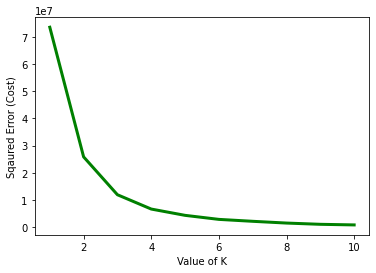

In [31]:
cost =[] 
for i in range(1, 11): 
    KM = KMeans(n_clusters = i, max_iter = 500) 
    KM.fit(bcn_grouped) 
      
    # calculates squared error 
    # for the clustered points 
    cost.append(KM.inertia_)      
  
# plot the cost against K values 
plt.plot(range(1, 11), cost, color ='g', linewidth ='3') 
plt.xlabel("Value of K") 
plt.ylabel("Sqaured Error (Cost)") 
plt.show() # clear the plot 
  
# the point of the elbow is the  
# most optimal value for choosing k 

#### As we can see in the plot above, the optimal value of K is 4.

In [32]:
# set number of clusters
kclusters = 4

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(bcn_grouped)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([2, 2, 2, 2, 1, 3, 1, 2, 2, 2], dtype=int32)

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [33]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

bcn_merged = df

# merge bcn_grouped with bcn_data to add latitude/longitude for each neighborhood
bcn_merged = bcn_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

bcn_merged.head() # check the last columns!

,Neighborhood,Avg Price per m2,CAGR,Location,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Baró de Viver,3695.106061,4.185477,"(Baró de Viver, Besòs, la Trinitat Vella, Sant...",41.449947,2.199539,2,Plaza,Metro Station,Track Stadium,Park,Café,Burger Joint,Supermarket,Optical Shop,Organic Grocery,Other Great Outdoors
1,Can Baró,3339.000000,5.894268,"(Can Baró, Horta-Guinardó, Barcelona, Barcelon...",41.416092,2.162402,2,Spanish Restaurant,Restaurant,Tapas Restaurant,Grocery Store,Scenic Lookout,Chinese Restaurant,Soccer Stadium,Breakfast Spot,Bus Station,Café
2,Can Peguera,3695.106061,4.185477,"(Can Peguera, Nou Barris, Barcelona, Barcelonè...",41.434857,2.165785,2,Park,German Restaurant,Basketball Stadium,Gym / Fitness Center,Grocery Store,Tapas Restaurant,Escape Room,Food & Drink Shop,Hostel,Brewery
3,Canyelles,3695.106061,4.185477,"(Canyelles, Nou Barris, Barcelona, Barcelonès,...",41.442835,2.165228,2,Soccer Field,Construction & Landscaping,Metro Station,Market,Skate Park,Tapas Restaurant,Grocery Store,Mediterranean Restaurant,Plaza,Food & Drink Shop
4,Ciutat Meridiana,1690.000000,2.456182,"(Ciutat Meridiana, Nou Barris, Barcelona, Barc...",41.460918,2.174567,1,Metro Station,Grocery Store,Supermarket,Park,Mediterranean Restaurant,Plaza,Yoga Studio,Paella Restaurant,Paper / Office Supplies Store,Palace


In [34]:
bcn_merged.to_excel("bcn_merged.xlsx") 

## 4. Exploratory Data Analysis
Now that we have the final data frame, we'll proceed with exploratory data analysis in order to have a better idea of the dataset composition.

In [35]:
bcn_describe = bcn_merged.describe()
bcn_describe

,Avg Price per m2,CAGR,Latitude,Longitude,Cluster Labels
count,73.000000,73.000000,73.000000,73.000000,73.000000
mean,3695.106061,4.185477,41.411991,2.166267,1.506849
std,1010.993902,1.934642,0.025799,0.026324,0.929804
min,1690.000000,-3.473222,41.353842,2.091489,0.000000
25%,2994.000000,3.447772,41.390140,2.144538,1.000000
50%,3695.106061,4.185477,41.414979,2.168368,2.000000
75%,4312.000000,5.015778,41.430019,2.184051,2.000000
max,6460.000000,8.631825,41.463372,2.224694,3.000000


In [36]:
bcn_describe.to_excel("bcn_desc.xlsx") 

In [37]:
bcn_merged.describe(include=object)

,Neighborhood,Location,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,73,73,73,73,73,73,73,73,73,73,73,73
unique,73,73,22,32,34,38,39,42,45,50,44,48
top,el Coll,"(Clot, el Camp de l'Arpa del Clot, Sant Martí,...",Spanish Restaurant,Restaurant,Restaurant,Tapas Restaurant,Spanish Restaurant,Italian Restaurant,Grocery Store,Breakfast Spot,Supermarket,Park
freq,1,1,12,6,10,6,5,6,5,3,8,4


#### Let's see which are the most common venues in Barcelona

In [38]:
MostCommonVenue = pd.DataFrame(bcn_merged['1st Most Common Venue'].value_counts())
MostCommonVenue.head(10)

,1st Most Common Venue
Spanish Restaurant,12
Tapas Restaurant,10
Bakery,5
Café,5
Mediterranean Restaurant,5
Hotel,5
Park,4
Supermarket,4
Grocery Store,4
Plaza,3


In [39]:
bcn_avg=bcn_merged[['Neighborhood','Avg Price per m2']].copy()
bcn_avg.head()

,Neighborhood,Avg Price per m2
0,Baró de Viver,3695.106061
1,Can Baró,3339.000000
2,Can Peguera,3695.106061
3,Canyelles,3695.106061
4,Ciutat Meridiana,1690.000000


In [40]:
bcn_avg = bcn_avg.sort_values(by='Avg Price per m2',ascending=False)

In [41]:
bcn_avg.reset_index()

,index,Neighborhood,Avg Price per m2
0,54,Pedralbes,6460.000000
1,5,Diagonal Mar i el Front Marítim del Poblenou,6237.000000
2,51,les Tres Torres,5749.000000
3,66,Sarrià,5558.000000
4,30,la Dreta de l'Eixample,5395.000000
5,60,Sant Gervasi - Galvany,5326.000000
6,48,la Vila Olímpica del Poblenou,5267.000000
7,26,l'Antiga Esquerra de l'Eixample,5190.000000
8,61,Sant Gervasi - la Bonanova,5115.000000
9,63,"Sant Pere, Santa Caterina i la Ribera",4837.000000


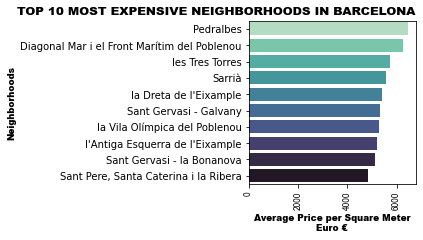

In [42]:
fig, ax = plt.subplots(figsize=(3,3))
ax = sns.barplot(x="Avg Price per m2", y="Neighborhood", data=bcn_avg.head(10), orient="h",
                 palette="mako_r")

plt.xlabel('Average Price per Square Meter\nEuro €', fontname='Arial Black', size=9) # add to x-label to the plot
plt.ylabel('Neighborhoods', fontname='Arial Black', size=9) # add y-label to the plot
plt.title('TOP 10 MOST EXPENSIVE NEIGHBORHOODS IN BARCELONA',loc='right',fontname='Arial Black', size=12) # add title to the plot

plt.setp(ax.get_xticklabels(),fontname='Arial Narrow', rotation = 90)

plt.savefig("bcn_avgtop.png",dpi=300)
plt.show()

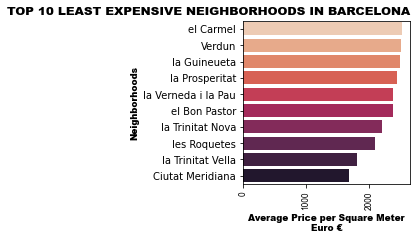

In [43]:
fig, ax = plt.subplots(figsize=(3,3))
ax = sns.barplot(x="Avg Price per m2", y="Neighborhood", data=bcn_avg.tail(10),orient="h",
                 palette="rocket_r")

plt.xlabel('Average Price per Square Meter\nEuro €', fontname='Arial Black', size=9) # add to x-label to the plot
plt.ylabel('Neighborhoods', fontname='Arial Black', size=9) # add y-label to the plot
plt.title('TOP 10 LEAST EXPENSIVE NEIGHBORHOODS IN BARCELONA',loc='right', fontname='Arial Black',size=12) # add title to the plot

plt.setp(ax.get_xticklabels(),fontname='Arial Narrow', rotation = 90)

plt.savefig("bcn_avgbot.png",dpi=300)
plt.show()

In [44]:
bcn_cagr=bcn_merged[['Neighborhood','CAGR']].copy()
bcn_cagr.head()

,Neighborhood,CAGR
0,Baró de Viver,4.185477
1,Can Baró,5.894268
2,Can Peguera,4.185477
3,Canyelles,4.185477
4,Ciutat Meridiana,2.456182


In [45]:
bcn_cagr = bcn_cagr.sort_values(by='CAGR',ascending=False)

In [46]:
bcn_cagr.reset_index()

,index,Neighborhood,CAGR
0,18,el Parc i la Llacuna del Poblenou,8.631825
1,15,el Congrés i els Indians,8.099120
2,31,la Font d'en Fargues,7.063684
3,72,Vilapicina i la Torre Llobeta,6.970199
4,32,la Font de la Guatlla,6.926714
5,53,Navas,6.789046
6,14,el Coll,6.704650
7,23,el Turó de la Peira,6.681338
8,42,la Teixonera,6.547721
9,13,el Clot,5.977474


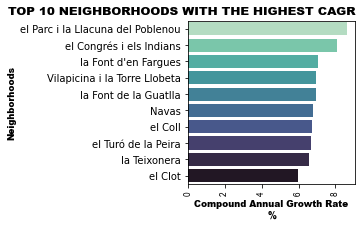

In [47]:
fig, ax = plt.subplots(figsize=(3,3))
ax = sns.barplot(x="CAGR", y="Neighborhood", data=bcn_cagr.head(10), orient="h",
                 palette="mako_r")

plt.xlabel('Compound Annual Growth Rate\n %',fontname='Arial Black', size=9) # add to x-label to the plot
plt.ylabel('Neighborhoods',fontname='Arial Black', size=9) # add y-label to the plot
plt.title('TOP 10 NEIGHBORHOODS WITH THE HIGHEST CAGR',loc='right',fontname='Arial Black',size=12) # add title to the plot

plt.setp(ax.get_xticklabels(),fontname='Arial Narrow',rotation = 90)

plt.savefig("bcn_cagrtop.png",dpi=300)
plt.show()

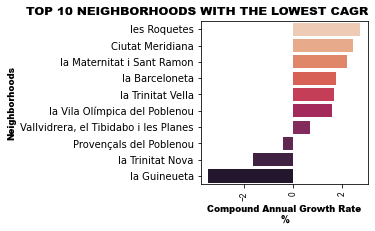

In [48]:
fig, ax = plt.subplots(figsize=(3,3))
ax = sns.barplot(x="CAGR", y="Neighborhood", data=bcn_cagr.tail(10), orient="h",
                 palette="rocket_r")

plt.xlabel('Compound Annual Growth Rate\n %',fontname='Arial Black', size=9) # add to x-label to the plot
plt.ylabel('Neighborhoods',fontname='Arial Black', size=9) # add y-label to the plot
plt.title('TOP 10 NEIGHBORHOODS WITH THE LOWEST CAGR',loc='right',fontname='Arial Black',size=12) # add title to the plot

plt.setp(ax.get_xticklabels(),fontname='Arial Narrow',rotation = 90)

plt.savefig("bcn_cagrbot.png",dpi=300)
plt.show()

Finally, let's visualize the resulting clusters

In [49]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(bcn_merged['Latitude'], bcn_merged['Longitude'], bcn_merged['Neighborhood'], bcn_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster-1)],
        fill=True,
        fill_color=rainbow[int(cluster-1)],
        fill_opacity=1).add_to(map_clusters)
       
map_clusters

In [50]:
map_clusters.save("map_clusters.html")

#### In order to create the choropleth maps we need to load the geojson file, which is later converted into a geopandas file with the necessary information for mapping out the figures.

In [51]:
#Loading data dependencies using geopandas
barris = gpd.read_file("barris.geojson")
barris.head(1)

,ID_ANNEX,ANNEXDESCR,ID_TEMA,TEMA_DESCR,ID_CONJUNT,CONJ_DESCR,ID_SUBCONJ,SCONJ_DESC,ID_ELEMENT,ELEM_DESCR,NIVELL,NDESCR_CA,NDESCR_ES,NDESCR_EN,TERME,DISTRICTE,BARRI,AEB,SEC_CENS,GRANBARRI,ZUA,AREA_I,LITERAL,PERIMETRE,AREA,ORD_REPRES,CODI_UA,TIPUS_UA,NOM,WEB1,WEB2,WEB3,DOCUMENTA,RANGESCALA,TIPUS_POL,GRUIX_ID,GRUIXDIMEN,ESTIL_ID,ESTIL_QGIS,VALOR1QGIS,VALOR2QGIS,COL_FARCIT,FCOL_DESCR,FHEX_COLOR,COL_DESCR,HEX_COLOR7,geometry
0,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,ADM_03_PL,Límit de barri (polígon),Límite de barrrio (polígono),Neighborhood boundary (polygon),080193,01,01,-,-,01,-,-,01,5521.647,1100286.137,3,01,BARRI,el Raval,http://lameva.barcelona.cat/ciutatvella/ca/hom...,http://www.bcn.cat/estadistica/catala/dades/in...,http://www.bcn.cat/estadistica/catala/document...,None,1-50000,None,6,70.0,0,Sòlid,0,0,41,NULL,#E66900,NULL,#73A88F,"POLYGON ((2.16471 41.38593, 2.16936 41.38554, ..."


In [52]:
barris=barris[['NOM','geometry']]

In [53]:
barris.head()

,NOM,geometry
0,el Raval,"POLYGON ((2.16471 41.38593, 2.16936 41.38554, ..."
1,el Barri Gòtic,"POLYGON ((2.17701 41.38525, 2.17873 41.38396, ..."
2,la Barceloneta,"POLYGON ((2.19623 41.38745, 2.19631 41.38745, ..."
3,la Dreta de l'Eixample,"POLYGON ((2.17091 41.40182, 2.17221 41.40083, ..."
4,l'Antiga Esquerra de l'Eixample,"POLYGON ((2.15736 41.39331, 2.15847 41.39245, ..."


In [54]:
barris = barris.rename(columns = {'NOM': 'Neighborhood'}, inplace = False)
barris.head()

,Neighborhood,geometry
0,el Raval,"POLYGON ((2.16471 41.38593, 2.16936 41.38554, ..."
1,el Barri Gòtic,"POLYGON ((2.17701 41.38525, 2.17873 41.38396, ..."
2,la Barceloneta,"POLYGON ((2.19623 41.38745, 2.19631 41.38745, ..."
3,la Dreta de l'Eixample,"POLYGON ((2.17091 41.40182, 2.17221 41.40083, ..."
4,l'Antiga Esquerra de l'Eixample,"POLYGON ((2.15736 41.39331, 2.15847 41.39245, ..."


In [55]:
barris['Neighborhood'] = barris['Neighborhood'].replace(['el Poble-sec'],'el Poble Sec')

In [56]:
barris

,Neighborhood,geometry
0,el Raval,"POLYGON ((2.16471 41.38593, 2.16936 41.38554, ..."
1,el Barri Gòtic,"POLYGON ((2.17701 41.38525, 2.17873 41.38396, ..."
2,la Barceloneta,"POLYGON ((2.19623 41.38745, 2.19631 41.38745, ..."
3,la Dreta de l'Eixample,"POLYGON ((2.17091 41.40182, 2.17221 41.40083, ..."
4,l'Antiga Esquerra de l'Eixample,"POLYGON ((2.15736 41.39331, 2.15847 41.39245, ..."
5,la Nova Esquerra de l'Eixample,"POLYGON ((2.14984 41.37539, 2.14977 41.37517, ..."
6,Sant Antoni,"POLYGON ((2.16779 41.37517, 2.16780 41.37498, ..."
7,el Poble Sec,"POLYGON ((2.17624 41.37286, 2.17619 41.37280, ..."
8,la Marina del Prat Vermell,"MULTIPOLYGON (((2.17653 41.37289, 2.17694 41.3..."
9,la Marina de Port,"POLYGON ((2.13962 41.36597, 2.13973 41.36586, ..."


In [57]:
barris_gdf=barris.merge(bcn_merged,on="Neighborhood")
barris_gdf

,Neighborhood,geometry,Avg Price per m2,CAGR,Location,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,el Raval,"POLYGON ((2.16471 41.38593, 2.16936 41.38554, ...",3587.000000,4.624226,"(el Raval, Ciutat Vella, Barcelona, Barcelonès...",41.379518,2.168368,2,Spanish Restaurant,Cocktail Bar,Bar,Mediterranean Restaurant,Tapas Restaurant,Pizza Place,Vegetarian / Vegan Restaurant,Restaurant,Theater,Bookstore
1,el Barri Gòtic,"POLYGON ((2.17701 41.38525, 2.17873 41.38396, ...",4717.000000,3.093769,"(el Gòtic, Ciutat Vella, Barcelona, Barcelonès...",41.383395,2.176912,0,Tapas Restaurant,Ice Cream Shop,Mediterranean Restaurant,Plaza,Spanish Restaurant,Italian Restaurant,Bar,Hotel,Coffee Shop,Burger Joint
2,la Barceloneta,"POLYGON ((2.19623 41.38745, 2.19631 41.38745, ...",4763.000000,1.771801,"(la Barceloneta, Ciutat Vella, Barcelona, Barc...",41.380653,2.189927,0,Tapas Restaurant,Mediterranean Restaurant,Paella Restaurant,Bar,Spanish Restaurant,Pizza Place,Seafood Restaurant,Burger Joint,Ice Cream Shop,Restaurant
3,la Dreta de l'Eixample,"POLYGON ((2.17091 41.40182, 2.17221 41.40083, ...",5395.000000,3.307643,"(la Dreta de l'Eixample, Eixample, Barcelona, ...",41.395037,2.167207,3,Hotel,Boutique,Mediterranean Restaurant,Tapas Restaurant,Bakery,Clothing Store,Hostel,Restaurant,Roof Deck,Japanese Restaurant
4,l'Antiga Esquerra de l'Eixample,"POLYGON ((2.15736 41.39331, 2.15847 41.39245, ...",5190.000000,5.699180,"(l'Antiga Esquerra de l'Eixample, Eixample, Ba...",41.390000,2.155000,3,Hotel,Spanish Restaurant,Cocktail Bar,Mediterranean Restaurant,Japanese Restaurant,Sandwich Place,Bakery,Pizza Place,Tapas Restaurant,Restaurant
5,la Nova Esquerra de l'Eixample,"POLYGON ((2.14984 41.37539, 2.14977 41.37517, ...",4312.000000,4.549944,"(la Nova Esquerra de l'Eixample, Eixample, Bar...",41.383389,2.149000,0,Mediterranean Restaurant,Café,Indian Restaurant,Supermarket,Spanish Restaurant,Bakery,Gym,Mobile Phone Shop,Flower Shop,Tapas Restaurant
6,Sant Antoni,"POLYGON ((2.16779 41.37517, 2.16780 41.37498, ...",4219.000000,5.367100,"(Sant Antoni, el Raval, Ciutat Vella, Barcelon...",41.380052,2.163327,0,Café,Mediterranean Restaurant,Bar,Cocktail Bar,Coffee Shop,Tapas Restaurant,Hotel,Bookstore,Spanish Restaurant,Gift Shop
7,el Poble Sec,"POLYGON ((2.17624 41.37286, 2.17619 41.37280, ...",3716.000000,5.855889,"(Poble Sec, Avinguda Paral·lel, Sant Antoni, E...",41.374980,2.160572,2,Tapas Restaurant,Pizza Place,Café,Cocktail Bar,Mediterranean Restaurant,Italian Restaurant,Coffee Shop,Gastropub,Spanish Restaurant,Asian Restaurant
8,la Marina del Prat Vermell,"MULTIPOLYGON (((2.17653 41.37289, 2.17694 41.3...",3701.000000,4.185477,"(la Marina del Prat Vermell, Sants-Montjuïc, B...",41.353842,2.142318,2,Spanish Restaurant,Mediterranean Restaurant,Supermarket,Furniture / Home Store,Food,Yoga Studio,Outdoor Sculpture,Paper / Office Supplies Store,Palace,Paella Restaurant
9,la Marina de Port,"POLYGON ((2.13962 41.36597, 2.13973 41.36586, ...",2861.000000,4.152079,"(la Marina de Port, Sants-Montjuïc, Barcelona,...",41.360296,2.137584,1,Spanish Restaurant,Grocery Store,Café,Bakery,Restaurant,Asian Restaurant,Transportation Service,Mediterranean Restaurant,Falafel Restaurant,Latin American Restaurant


In [58]:
barris_gdf = barris_gdf.drop(['Location','Latitude','Longitude','1st Most Common Venue','2nd Most Common Venue','3rd Most Common Venue','4th Most Common Venue','5th Most Common Venue','6th Most Common Venue','7th Most Common Venue','8th Most Common Venue','9th Most Common Venue','10th Most Common Venue'],axis=1)

In [59]:
barris_gdf

,Neighborhood,geometry,Avg Price per m2,CAGR,Cluster Labels
0,el Raval,"POLYGON ((2.16471 41.38593, 2.16936 41.38554, ...",3587.000000,4.624226,2
1,el Barri Gòtic,"POLYGON ((2.17701 41.38525, 2.17873 41.38396, ...",4717.000000,3.093769,0
2,la Barceloneta,"POLYGON ((2.19623 41.38745, 2.19631 41.38745, ...",4763.000000,1.771801,0
3,la Dreta de l'Eixample,"POLYGON ((2.17091 41.40182, 2.17221 41.40083, ...",5395.000000,3.307643,3
4,l'Antiga Esquerra de l'Eixample,"POLYGON ((2.15736 41.39331, 2.15847 41.39245, ...",5190.000000,5.699180,3
5,la Nova Esquerra de l'Eixample,"POLYGON ((2.14984 41.37539, 2.14977 41.37517, ...",4312.000000,4.549944,0
6,Sant Antoni,"POLYGON ((2.16779 41.37517, 2.16780 41.37498, ...",4219.000000,5.367100,0
7,el Poble Sec,"POLYGON ((2.17624 41.37286, 2.17619 41.37280, ...",3716.000000,5.855889,2
8,la Marina del Prat Vermell,"MULTIPOLYGON (((2.17653 41.37289, 2.17694 41.3...",3701.000000,4.185477,2
9,la Marina de Port,"POLYGON ((2.13962 41.36597, 2.13973 41.36586, ...",2861.000000,4.152079,1


In [60]:
# Creating Map
bcnavg_map = folium.Map(location=[latitude, longitude], zoom_start=11,tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(bcnavg_map)

# Creating choropleth map
bcnavg_map.choropleth(geo_data=barris_gdf,
             name='Choropleth',         
             data=barris_gdf,
             columns=['Neighborhood','Avg Price per m2'], 
             key_on='feature.properties.Neighborhood', 
             fill_color='YlOrRd',
             fill_opacity=0.7, 
             line_opacity=0.2,
             legend_name='Average Price per Square Meter', 
             smooth_factor=0,     
             highlight=True
                 )

# Adding labels to map
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
BarrisName = folium.features.GeoJson(
    barris_gdf,
    style_function=style_function, 
    control=False,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighborhood',
               'Avg Price per m2'],
        aliases=['Neighborhood: ',
                'Average Price per Square Meter'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
bcnavg_map.add_child(BarrisName)
bcnavg_map.keep_in_front(BarrisName)
folium.LayerControl().add_to(bcnavg_map)
bcnavg_map

/Users/kristopherzapata/opt/anaconda3/lib/python3.7/site-packages/folium/folium.py:413: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [61]:
bcnavg_map.save("AVG_PRICE_BCN.html")

In [62]:
# Creating Map
bcncagr_map = folium.Map(location=[latitude, longitude], zoom_start=11,tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(bcncagr_map)

# Creating choropleth map
bcncagr_map.choropleth(geo_data=barris_gdf,
             name='Choropleth',         
             data=barris_gdf,
             columns=['Neighborhood','CAGR'], 
             key_on='feature.properties.Neighborhood', 
             fill_color='PuBuGn',
             fill_opacity=0.8, 
             line_opacity=0.2,
             legend_name='Compound Annual Growth Rate %', 
             smooth_factor=0,     
             highlight=True
                 )
# Adding labels to map
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
BarrisName = folium.features.GeoJson(
    barris_gdf,
    style_function=style_function, 
    control=False,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighborhood',
               'CAGR'],
        aliases=['Neighborhood: ',
                'Compound Annual Growth Rate %'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
bcncagr_map.add_child(BarrisName)
bcncagr_map.keep_in_front(BarrisName)
folium.LayerControl().add_to(bcncagr_map)
bcncagr_map

In [63]:
bcncagr_map.save("CAGR_BCN.html")

In [64]:
# Creating Map
cluster_map = folium.Map(location=[latitude, longitude], zoom_start=11,tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(cluster_map)

# Creating choropleth map
cluster_map.choropleth(geo_data=barris_gdf,
             name='Choropleth',         
             data=barris_gdf,
             columns=['Neighborhood','Cluster Labels'], 
             key_on='feature.properties.Neighborhood', 
             fill_color='YlGnBu',
             fill_opacity=0.7, 
             line_opacity=0.2,
             legend_name='Cluster Labels', 
             smooth_factor=0,     
             highlight=True
                 )
# Adding labels to map
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
BarrisName = folium.features.GeoJson(
    barris_gdf,
    style_function=style_function, 
    control=False,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighborhood',
                'Cluster Labels',
               'Avg Price per m2',
               'CAGR'],
        aliases=['Neighborhood: ',
                 'Cluster Labels: ',
                'Average Price per Square Meter: ',
                'Compound Annual Growth Rate %: '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
cluster_map.add_child(BarrisName)
cluster_map.keep_in_front(BarrisName)
folium.LayerControl().add_to(cluster_map)
cluster_map

In [65]:
cluster_map.save("CLUSTERMAP_BCN.html")

#### Now let's explore each cluster in order to determine what name best describes it. In order to make a proper description of each cluster, I'll be using the data provided in each cluster. However, as a Barcelona resident myself, I'll also be describing the average profile of the person within each cluster based on my own knowledge of the city, its neighborhoods and the people who live there.

### Cluster 0 - Upper Mid: 

With the exception of the inclusion of el Putxet i el Farró, most of the neighborhoods included in this cluster are within the city center and are destined for the middle class. I would say that the neighborhoods mentioned before were classified within this cluster due to the average housing price, considering that it's closer to these neighborhoods than to the neighborhoods in cluster 3. Excluding el Putxet i el Farró, if one would define the average profile of the people living in this area, one would say: young people, in their 20s and 30s, most of them sharing a flat, working,studying or both, looking to be located near where most of the action happens in the city. 

In [66]:
upper_mid=bcn_merged.loc[bcn_merged['Cluster Labels'] == 0, bcn_merged.columns[[0,1,2] + list(range(7, bcn_merged.shape[1]))]]
upper_mid

,Neighborhood,Avg Price per m2,CAGR,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
7,el Barri Gòtic,4717.0,3.093769,Tapas Restaurant,Ice Cream Shop,Mediterranean Restaurant,Plaza,Spanish Restaurant,Italian Restaurant,Bar,Hotel,Coffee Shop,Burger Joint
10,el Camp d'en Grassot i Gràcia Nova,4399.0,4.910521,Tapas Restaurant,Bakery,Restaurant,Spanish Restaurant,Mediterranean Restaurant,Japanese Restaurant,Hotel,Cocktail Bar,Gym,Middle Eastern Restaurant
16,el Fort Pienc,4091.0,4.342948,Coffee Shop,Sushi Restaurant,Spanish Restaurant,Mediterranean Restaurant,Szechuan Restaurant,Soccer Stadium,Beer Bar,Bistro,Gym / Fitness Center,Gym
18,el Parc i la Llacuna del Poblenou,4567.0,8.631825,Hotel,Restaurant,Bar,Tapas Restaurant,Clothing Store,Mediterranean Restaurant,Coffee Shop,Breakfast Spot,Music Venue,Nightclub
20,el Poblenou,4557.0,4.072906,Mediterranean Restaurant,Spanish Restaurant,Restaurant,Bakery,Tapas Restaurant,Italian Restaurant,Pizza Place,Breakfast Spot,Gastropub,Indian Restaurant
21,el Putxet i el Farró,4532.0,4.645340,Bakery,Café,Italian Restaurant,Wine Bar,Burger Joint,Seafood Restaurant,Mediterranean Restaurant,Supermarket,Breakfast Spot,Tapas Restaurant
27,la Barceloneta,4763.0,1.771801,Tapas Restaurant,Mediterranean Restaurant,Paella Restaurant,Bar,Spanish Restaurant,Pizza Place,Seafood Restaurant,Burger Joint,Ice Cream Shop,Restaurant
37,la Nova Esquerra de l'Eixample,4312.0,4.549944,Mediterranean Restaurant,Café,Indian Restaurant,Supermarket,Spanish Restaurant,Bakery,Gym,Mobile Phone Shop,Flower Shop,Tapas Restaurant
39,la Sagrada Família,4088.0,4.376243,Burger Joint,Hotel,Restaurant,Mexican Restaurant,Bakery,Italian Restaurant,Sandwich Place,Plaza,Supermarket,Vegetarian / Vegan Restaurant
47,la Vila de Gràcia,4343.0,4.164553,Mediterranean Restaurant,Plaza,Bar,Pizza Place,Bakery,Arts & Crafts Store,Spanish Restaurant,Tapas Restaurant,Restaurant,Ice Cream Shop


In [67]:
upper_mid = upper_mid.reset_index()

In [68]:
upper_mid_desc= upper_mid.describe()
upper_mid_desc

,index,Avg Price per m2,CAGR
count,13.000000,13.000000,13.000000
mean,31.692308,4467.615385,4.481670
std,18.427265,247.462300,1.536732
min,7.000000,4088.000000,1.771801
25%,18.000000,4312.000000,4.072906
50%,27.000000,4532.000000,4.376243
75%,47.000000,4654.000000,4.645340
max,63.000000,4837.000000,8.631825


In [69]:
upper_mid_desc_cat = upper_mid.describe(include=object)
upper_mid_desc_cat

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,13,13,13,13,13,13,13,13,13,13,13
unique,13,8,10,8,13,10,11,11,12,12,11
top,el Parc i la Llacuna del Poblenou,Mediterranean Restaurant,Mediterranean Restaurant,Restaurant,Spanish Restaurant,Spanish Restaurant,Italian Restaurant,Coffee Shop,Breakfast Spot,Supermarket,Tapas Restaurant
freq,1,3,2,4,1,3,3,2,2,2,2


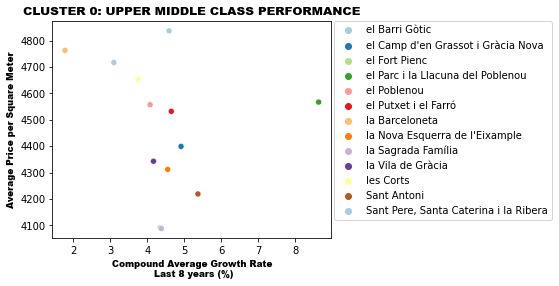

In [70]:
fig, ax = plt.subplots(figsize=(5,4))
ax = sns.scatterplot(data=upper_mid,x="CAGR", y="Avg Price per m2", hue="Neighborhood", palette="Paired")

plt.xlabel('Compound Average Growth Rate\n Last 8 years (%)', fontname='Arial Black', size=9) # add to x-label to the plot
plt.ylabel('Average Price per Square Meter', fontname='Arial Black', size=9) # add y-label to the plot
plt.title('CLUSTER 0: UPPER MIDDLE CLASS PERFORMANCE',loc='center',fontname='Arial Black', size=12) # add title to the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)

plt.savefig("uppermid_kpi.png",dpi=300)
plt.show()

### Cluster 1 - Outskirts
The most important characteristics of this cluster is the fact that most of the neighborhoods in this cluster are comparatively cheaper in comparison to the neighborhoods in the other clusters and are located in the outskirts of the city. In this case, I find it harder to define the profile of the average person living in these neighborhoods.  Based on it's most common venues, I would say its a combination of local, lower middle class with hard working immigrant families due to the high amount of grocery stores and parks. 

In [71]:
outskirts=bcn_merged.loc[bcn_merged['Cluster Labels'] == 1, bcn_merged.columns[[0,1,2] + list(range(7, bcn_merged.shape[1]))]]
outskirts

,Neighborhood,Avg Price per m2,CAGR,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,Ciutat Meridiana,1690.0,2.456182,Metro Station,Grocery Store,Supermarket,Park,Mediterranean Restaurant,Plaza,Yoga Studio,Paella Restaurant,Paper / Office Supplies Store,Palace
8,el Besòs i el Maresme,2547.0,4.094427,Diner,Hotel,Climbing Gym,Big Box Store,Supermarket,Spanish Restaurant,Restaurant,Bakery,Gym / Fitness Center,Pedestrian Plaza
9,el Bon Pastor,2380.0,4.017967,Café,Athletics & Sports,Bakery,Mediterranean Restaurant,Restaurant,Tapas Restaurant,Yoga Studio,Pastry Shop,Park,Paper / Office Supplies Store
12,el Carmel,2532.0,5.592017,Gym,Grocery Store,Supermarket,Food Court,Plaza,Coffee Shop,Café,Yoga Studio,Paella Restaurant,Park
23,el Turó de la Peira,2534.0,6.681338,Supermarket,Pizza Place,Café,Burger Joint,Tapas Restaurant,Bar,Martial Arts School,Restaurant,Farmers Market,Park
24,Horta,2953.0,3.291666,Tapas Restaurant,Pizza Place,Spanish Restaurant,Café,Sandwich Place,Mediterranean Restaurant,Bakery,Chinese Restaurant,Supermarket,Performing Arts Venue
33,la Guineueta,2498.0,-3.473222,Plaza,Grocery Store,Seafood Restaurant,Diner,Skate Park,Fast Food Restaurant,Metro Station,Park,Tapas Restaurant,Snack Place
34,la Marina de Port,2861.0,4.152079,Spanish Restaurant,Grocery Store,Café,Bakery,Restaurant,Asian Restaurant,Transportation Service,Mediterranean Restaurant,Falafel Restaurant,Latin American Restaurant
38,la Prosperitat,2446.0,2.910214,Grocery Store,Spanish Restaurant,Park,Tapas Restaurant,South American Restaurant,Pizza Place,Bar,Chinese Restaurant,Sushi Restaurant,Brewery
43,la Trinitat Nova,2200.0,-1.662166,Metro Station,Breakfast Spot,Plaza,Music Venue,Park,Pharmacy,Grocery Store,Spanish Restaurant,Supermarket,Optical Shop


In [72]:
outskirts = outskirts.reset_index()

In [73]:
outskirts_desc=outskirts.describe()
outskirts_desc

,index,Avg Price per m2,CAGR
count,19.000000,19.000000,19.000000
mean,39.105263,2520.842105,3.232335
std,21.286132,376.170508,2.688253
min,4.000000,1690.000000,-3.473222
25%,23.500000,2384.500000,2.608618
50%,43.000000,2532.000000,4.017967
75%,55.500000,2864.000000,4.884290
max,72.000000,2994.000000,6.970199


In [74]:
outskirts_desc_cat = outskirts.describe(include=object)
outskirts_desc_cat

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,19,19,19,19,19,19,19,19,19,19,19
unique,19,12,11,11,19,16,17,18,16,17,17
top,Porta,Grocery Store,Grocery Store,Spanish Restaurant,Diner,Restaurant,Tapas Restaurant,Yoga Studio,Chinese Restaurant,Park,Park
freq,1,4,5,4,1,2,3,2,2,2,2


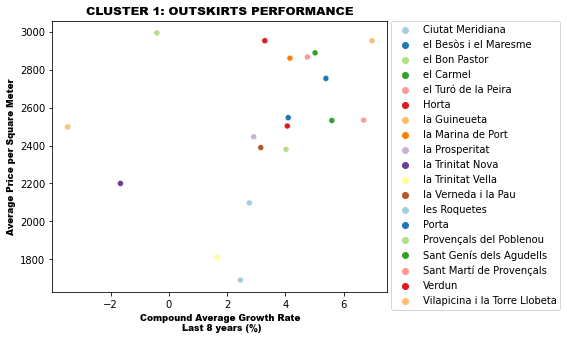

In [75]:
fig, ax = plt.subplots(figsize=(6,5))
ax = sns.scatterplot(data=outskirts,x="CAGR", y="Avg Price per m2", hue="Neighborhood", palette="Paired")

plt.xlabel('Compound Average Growth Rate\n Last 8 years (%)', fontname='Arial Black', size=9) # add to x-label to the plot
plt.ylabel('Average Price per Square Meter', fontname='Arial Black', size=9) # add y-label to the plot
plt.title('CLUSTER 1: OUTSKIRTS PERFORMANCE',loc='center',fontname='Arial Black', size=12) # add title to the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)

plt.savefig("outskirts_kpi.png",dpi=300)
plt.show()

### Cluster 2 - Lower Mid
Based on the average housing price, these neighborhoods are destined for the lower middle class. With the exception of el Raval which is overun by vacation rentals, most of the neighborhoods in this cluster are mostly composed of the following profile: Lower middle class family that enjoy "Vida de Barrio" which means enjoying spending time with their friends and families within their own neighborhood. 

In [76]:
lower_mid=bcn_merged.loc[bcn_merged['Cluster Labels'] == 2, bcn_merged.columns[[0,1,2] + list(range(7, bcn_merged.shape[1]))]]
lower_mid

,Neighborhood,Avg Price per m2,CAGR,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Baró de Viver,3695.106061,4.185477,Plaza,Metro Station,Track Stadium,Park,Café,Burger Joint,Supermarket,Optical Shop,Organic Grocery,Other Great Outdoors
1,Can Baró,3339.000000,5.894268,Spanish Restaurant,Restaurant,Tapas Restaurant,Grocery Store,Scenic Lookout,Chinese Restaurant,Soccer Stadium,Breakfast Spot,Bus Station,Café
2,Can Peguera,3695.106061,4.185477,Park,German Restaurant,Basketball Stadium,Gym / Fitness Center,Grocery Store,Tapas Restaurant,Escape Room,Food & Drink Shop,Hostel,Brewery
3,Canyelles,3695.106061,4.185477,Soccer Field,Construction & Landscaping,Metro Station,Market,Skate Park,Tapas Restaurant,Grocery Store,Mediterranean Restaurant,Plaza,Food & Drink Shop
6,el Baix Guinardó,3611.000000,4.758328,Tapas Restaurant,Japanese Restaurant,Restaurant,Bar,Grocery Store,Café,Breakfast Spot,Bakery,Supermarket,Hotel
11,el Camp de l'Arpa del Clot,3555.000000,5.266727,Bakery,Hotel,Café,Pizza Place,Spanish Restaurant,Restaurant,Gym / Fitness Center,Grocery Store,Burger Joint,Mediterranean Restaurant
13,el Clot,3767.000000,5.977474,Café,Spanish Restaurant,Restaurant,Pizza Place,Hotel,Bakery,Tapas Restaurant,Plaza,Mediterranean Restaurant,Grocery Store
14,el Coll,3420.000000,6.704650,Park,Hotel,Scenic Lookout,Supermarket,Mountain,Mediterranean Restaurant,Yoga Studio,Outdoors & Recreation,Paper / Office Supplies Store,Palace
15,el Congrés i els Indians,3271.000000,8.099120,Tapas Restaurant,Grocery Store,Restaurant,Bakery,Plaza,Pizza Place,Spanish Restaurant,Pharmacy,Supermarket,Farmers Market
17,el Guinardó,3304.000000,4.219412,Tapas Restaurant,Restaurant,Breakfast Spot,Café,Plaza,Gym,Athletics & Sports,Cafeteria,Supermarket,Park


In [77]:
lower_mid = lower_mid.reset_index()

In [78]:
lower_mid_desc=lower_mid.describe()
lower_mid_desc

,index,Avg Price per m2,CAGR
count,32.000000,32.000000,32.000000
mean,33.500000,3545.960701,4.738231
std,22.480099,225.417839,1.522347
min,0.000000,3128.000000,0.677400
25%,14.750000,3330.250000,4.185477
50%,31.500000,3599.000000,4.251812
75%,52.250000,3696.579545,5.865484
max,70.000000,3918.000000,8.099120


In [79]:
lower_mid_desc_cat = lower_mid.describe(include=object)
lower_mid_desc_cat

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,32,32,32,32,32,32,32,32,32,32,32
unique,32,12,22,19,20,20,25,26,29,24,26
top,Sants-Badal,Spanish Restaurant,Restaurant,Restaurant,Supermarket,Plaza,Pizza Place,Grocery Store,Grocery Store,Supermarket,Spanish Restaurant
freq,1,9,4,5,4,3,3,3,2,4,2


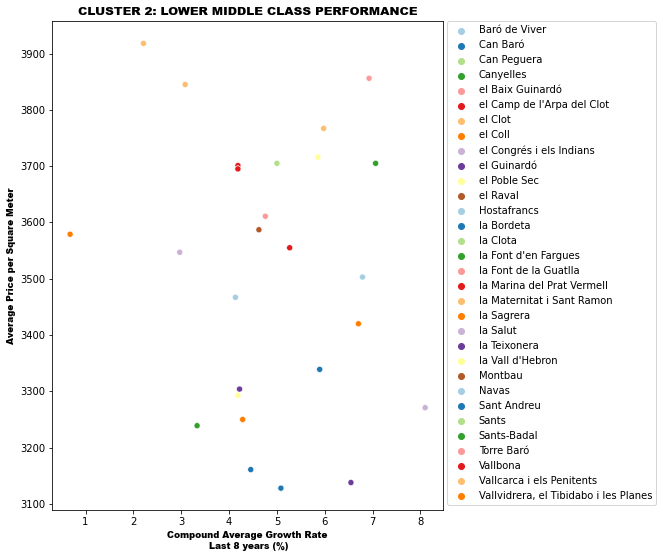

In [80]:
fig, ax = plt.subplots(figsize=(7,9))
ax = sns.scatterplot(data=lower_mid,x="CAGR", y="Avg Price per m2", hue="Neighborhood", palette="Paired")

plt.xlabel('Compound Average Growth Rate\n Last 8 years (%)', fontname='Arial Black', size=9) # add to x-label to the plot
plt.ylabel('Average Price per Square Meter', fontname='Arial Black', size=9) # add y-label to the plot
plt.title('CLUSTER 2: LOWER MIDDLE CLASS PERFORMANCE',loc='center',fontname='Arial Black', size=12) # add title to the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)

plt.savefig("lowermid_kpi.png",dpi=300)
plt.show()

### Cluster 3 - High End Neighborhoods: 
As seen by the Average price per square meter, these are the most expensive neighborhoods to purchase a home in Barcelona. Within this cluster, there are 3 inner clusters that define its composition. the first inner cluster, La Dreta de l'Eixample and l'Antiga Esquerra de l'Eixample are probably the best located neighborhoods in the city. There right in the middle of the city, but not in Ciutat Vella district which can be very noisy and crowded, but still surrounded by very nice, cool places nearby with very beautiful streets with loads of stores and restaurants/bars to enjoy like Enric Granados and Rambla de Catalunya. The outsiders of the cluster would be la Vila Olimpica de Poble Nou and Diagonal Mar, which are located at the beach side of the city. These neighborhoods represent the new and very modern areas of the city, mostly destined for beach side properties and offices. The rest of the neighborhoods within this cluster are very similar and are close in proximity, representing very traditional, "old money", composed mostly of upper middle, high class families looking for a much more quiet lifestyle but still want easy access to the city center in case they need it. 

In [81]:
high_end=bcn_merged.loc[bcn_merged['Cluster Labels'] == 3, bcn_merged.columns[[0,1,2] + list(range(7, bcn_merged.shape[1]))]]
high_end

,Neighborhood,Avg Price per m2,CAGR,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,Diagonal Mar i el Front Marítim del Poblenou,6237.0,4.055311,Mediterranean Restaurant,Restaurant,Italian Restaurant,Beach,Beach Bar,Hotel,Breakfast Spot,Track,Thai Restaurant,Bistro
26,l'Antiga Esquerra de l'Eixample,5190.0,5.699180,Hotel,Spanish Restaurant,Cocktail Bar,Mediterranean Restaurant,Japanese Restaurant,Sandwich Place,Bakery,Pizza Place,Tapas Restaurant,Restaurant
30,la Dreta de l'Eixample,5395.0,3.307643,Hotel,Boutique,Mediterranean Restaurant,Tapas Restaurant,Bakery,Clothing Store,Hostel,Restaurant,Roof Deck,Japanese Restaurant
48,la Vila Olímpica del Poblenou,5267.0,1.577094,Café,Mediterranean Restaurant,Restaurant,Nightclub,Hookah Bar,Cocktail Bar,Paella Restaurant,Italian Restaurant,Spanish Restaurant,Hotel
51,les Tres Torres,5749.0,3.531654,Hotel,Spanish Restaurant,Burger Joint,Mexican Restaurant,Japanese Restaurant,Restaurant,Café,Gym,Sushi Restaurant,Multiplex
54,Pedralbes,6460.0,3.985085,Garden,Mediterranean Restaurant,Spanish Restaurant,Print Shop,College Cafeteria,Nightclub,Café,Garden Center,Palace,Park
60,Sant Gervasi - Galvany,5326.0,4.556179,Mediterranean Restaurant,Café,Deli / Bodega,Sandwich Place,Japanese Restaurant,Italian Restaurant,Grocery Store,Spanish Restaurant,Hotel,Tapas Restaurant
61,Sant Gervasi - la Bonanova,5115.0,4.080438,Bakery,Seafood Restaurant,Mediterranean Restaurant,Spanish Restaurant,Bar,Japanese Restaurant,Plaza,Pizza Place,Restaurant,Dim Sum Restaurant
66,Sarrià,5558.0,3.447772,Bakery,Café,Mediterranean Restaurant,Tapas Restaurant,Diner,Breakfast Spot,Burger Joint,Pedestrian Plaza,Restaurant,Dessert Shop


In [82]:
high_end = high_end.reset_index()

In [83]:
high_end_desc=high_end.describe()
high_end_desc

,index,Avg Price per m2,CAGR
count,9.000000,9.000000,9.000000
mean,44.555556,5588.555556,3.804484
std,20.100442,474.271840,1.103200
min,5.000000,5115.000000,1.577094
25%,30.000000,5267.000000,3.447772
50%,51.000000,5395.000000,3.985085
75%,60.000000,5749.000000,4.080438
max,66.000000,6460.000000,5.699180


In [84]:
high_end_desc_cat = high_end.describe(include=object)
high_end_desc_cat

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,9,9,9,9,9,9,9,9,9,9,9
unique,9,5,6,7,8,7,9,8,8,8,9
top,Sant Gervasi - la Bonanova,Hotel,Café,Mediterranean Restaurant,Tapas Restaurant,Japanese Restaurant,Nightclub,Café,Pizza Place,Restaurant,Japanese Restaurant
freq,1,3,2,3,2,3,1,2,2,2,1


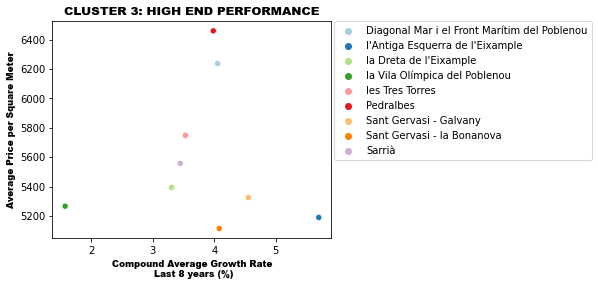

In [85]:
fig, ax = plt.subplots(figsize=(5,4))
ax = sns.scatterplot(data=high_end,x="CAGR", y="Avg Price per m2", hue="Neighborhood", palette="Paired")

plt.xlabel('Compound Average Growth Rate\n Last 8 years (%)', fontname='Arial Black', size=9) # add to x-label to the plot
plt.ylabel('Average Price per Square Meter', fontname='Arial Black', size=9) # add y-label to the plot
plt.title('CLUSTER 3: HIGH END PERFORMANCE',loc='center',fontname='Arial Black', size=12) # add title to the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)


plt.savefig("highend_kpi.png",dpi=300)
plt.show()

### Let's save these dataframes for the report.

In [86]:
with pd.ExcelWriter('Map_Clusters.xlsx') as writer:  
    upper_mid.to_excel(writer, sheet_name='Upper_Mid')
    upper_mid_desc.to_excel(writer, sheet_name='Upper_Mid_Desc')
    outskirts.to_excel(writer, sheet_name='Outskirts')
    outskirts_desc.to_excel(writer, sheet_name='Outskirts_Desc')
    lower_mid.to_excel(writer, sheet_name='Lower_Mid')
    lower_mid_desc.to_excel(writer, sheet_name='Lower_Mid_Desc')
    high_end.to_excel(writer, sheet_name='High_End')
    high_end_desc.to_excel(writer, sheet_name='High_End_Desc')

In [87]:
with pd.ExcelWriter('Map_Clusters_desc.xlsx') as writer:  
    upper_mid_desc_cat.to_excel(writer, sheet_name='Upper_Mid_Desc')
    outskirts_desc_cat.to_excel(writer, sheet_name='Outskirts_Desc')
    lower_mid_desc_cat.to_excel(writer, sheet_name='Lower_Mid_Desc')
    high_end_desc_cat.to_excel(writer, sheet_name='High_End_Desc')

### Last but not least, I would like to compare the clusters created and how they fare in the key metrics, therefore we'll proceed with creating a data frame with the pertinent information per each cluster and plot them together in a bubble plot.

In [88]:
cluster_comparison = {'Cluster': ['0 - Upper Middle Class', '1 - Outskirts', '2 - Lower Middle Class', '3 - High End'], 'Average Housing Price Index': [4468, 2521, 3546, 5589],'CAGR':[4.48, 3.23, 4.74, 3.80],'Neighborhood Count':[13,19,32,9]} 

In [89]:
cluster_comparison = pd.DataFrame(cluster_comparison)

### Cluster Comparison

In [90]:
cluster_comparison

,Cluster,Average Housing Price Index,CAGR,Neighborhood Count
0,0 - Upper Middle Class,4468,4.48,13
1,1 - Outskirts,2521,3.23,19
2,2 - Lower Middle Class,3546,4.74,32
3,3 - High End,5589,3.80,9


### Bubble Plot of Cluster Comparison

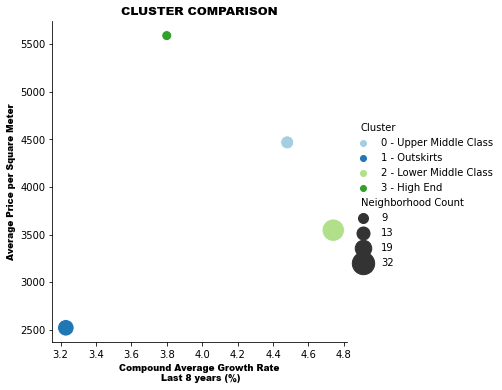

In [91]:
fig,
ax = sns.relplot(data=cluster_comparison,x="CAGR", y="Average Housing Price Index", hue="Cluster",size="Neighborhood Count",sizes=(100,500), palette="Paired")

plt.xlabel('Compound Average Growth Rate\n Last 8 years (%)', fontname='Arial Black', size=9) # add to x-label to the plot
plt.ylabel('Average Price per Square Meter', fontname='Arial Black', size=9) # add y-label to the plot
plt.title('CLUSTER COMPARISON',loc='center',fontname='Arial Black', size=12) # add title to the plot


plt.savefig("clustercomp_kpi.png",dpi=300)
plt.show()